In [10]:
import pyvinecopulib as pv
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as scs
from Ratio import *
from tqdm import tqdm
from statsmodels.distributions.empirical_distribution import ECDF as fit_ecdf
from scipy.special import logsumexp

def emp_cdf(v, u):
    """ evaluate the empirical copula at points v using the samples u"""
    # cdf is evaluated at points v, v has to be a MxD vector in [0,1]^D, cdf is evaluated at these points
    # u are samples from model NxD vector in [0,1]^D, u should be very large
    # larger u will lead to better estimation of the empirical copula but slows down computation
    cdf_vals = np.empty(shape=(len(v)))
    for i in range(v.shape[0]):
        cdf_vals[i] = np.sum(np.all(u<=v[[i],:], axis=1))
    return cdf_vals/len(u)

### Sampling the data for 2D experiments

In [12]:
def sample(cop_name, nsamples, params):
    if cop_name == "gaussian":
        corrMatrix = params["corrMatrix"]
        copula = pv.Bicop(family=pv.BicopFamily.gaussian, parameters=corrMatrix)
    elif cop_name == "student":
        corrMatrix = params["corrMatrix"]
        nu = params["nu"]
        copula = pv.Bicop(family=pv.BicopFamily.student, parameters=[corrMatrix, nu])
    elif cop_name == "clayton":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.clayton, parameters=theta)
    elif cop_name == "gumbel":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.gumbel, parameters=theta)
    elif cop_name == "mixture":
        combination = params["combination"]
        copulas = [pv.Bicop(family=pv.BicopFamily[comp["type"]], parameters=comp["theta"]) for comp in combination]
        weights = [comp["weight"] for comp in combination]
        copula = pv.MixtureBicop(copulas, weights)
    else:
        raise ValueError(f"Unknown copula type: {cop_name}")
    
    return copula.simulate(nsamples)

def log_likelihood(cop_name, u1, u2, params):
    if cop_name == "gaussian":
        corrMatrix = params["corrMatrix"]
        copula = pv.Bicop(family=pv.BicopFamily.gaussian, parameters=corrMatrix)
    elif cop_name == "student":
        corrMatrix = params["corrMatrix"]
        nu = params["nu"]
        copula = pv.Bicop(family=pv.BicopFamily.student, parameters=[corrMatrix, nu])
    elif cop_name == "clayton":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.clayton, parameters=theta)
    elif cop_name == "gumbel":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.gumbel, parameters=theta)
    else:
        raise ValueError(f"Unknown copula type: {cop_name}")
    
    data = np.column_stack((u1, u2))
    return copula.loglik(data)

# Example usage:
params_gaussian = {"corrMatrix": [0.1]}
samples = sample("gaussian", 500, params_gaussian)
u1, u2 = samples[:, 0], samples[:, 1]
log_likelihood_value = log_likelihood("gaussian", u1, u2, params_gaussian)
print(log_likelihood_value)

4.703999085553733


In [13]:
N_TRAIN = 1000
N_TEST = 5000
N_ROUNDS = 25
np.random.seed(990109)

sims_runs_all = []
log_likelihoods_runs_all = []

for round in tqdm(range(N_ROUNDS)):
    # Generate data

    # Student-t
    corrMatrix = np.random.uniform(0.5,0.95)
    nu = np.random.uniform(2,10)

    params_student = {"corrMatrix": corrMatrix, "nu": nu}
    samples_student = sample("student", N_TRAIN + N_TEST, params_student)
    u1_student, u2_student = samples_student[:, 0], samples_student[:, 1]
    log_likelihood_student = log_likelihood("student", u1_student[N_TRAIN:], u2_student[N_TRAIN:], params_student)

    # Clayton
    theta = 2
    params_clayton = {"theta": [theta]}
    samples_clayton = sample("clayton", N_TRAIN + N_TEST, params_clayton)
    u1_clayton, u2_clayton = samples_clayton[:, 0], samples_clayton[:, 1]
    log_likelihood_clayton = log_likelihood("clayton", u1_clayton[N_TRAIN:], u2_clayton[N_TRAIN:], params_clayton)

    # Gumbel
    theta = 2
    params_gumbel = {"theta": [theta]}
    samples_gumbel = sample("gumbel", N_TRAIN + N_TEST, params_gumbel)
    u1_gumbel, u2_gumbel = samples_gumbel[:, 0], samples_gumbel[:, 1]
    log_likelihood_gumbel = log_likelihood("gumbel", u1_gumbel[N_TRAIN:], u2_gumbel[N_TRAIN:], params_gumbel)

    # Mixture of 2 gaussians (using scipy.stats: first mixture on gaussian z-space, then transform to copula u-space)
    '''
    # My mixture 
    means = [[np.random.uniform(-5, 5), np.random.uniform(-5, 5)]for _ in range(2)]
    covs = [np.random.uniform(-0.95, 0.95), np.random.uniform(-0.95, 0.95)]
    multipliers = [np.random.uniform(0.8,1.2), np.random.uniform(0.8,1.2)]
    z = np.concatenate(
        [scs.multivariate_normal.rvs(
        mean=means[i], cov=multipliers[i]*np.array([[1,covs[i]],[covs[i],1]]
        ), size=int((N_TRAIN + N_TEST)/2)) for i in range(2)])
    u_1_mix = 0.5*(scs.norm(loc=means[0][0], scale=multipliers[0]).cdf(z[:,0]) + scs.norm(loc=means[1][0], scale=multipliers[1]).cdf(z[:,0]))
    u_2_mix = 0.5*(scs.norm(loc=means[0][1], scale=multipliers[0]).cdf(z[:,1]) + scs.norm(loc=means[1][1], scale=multipliers[1]).cdf(z[:,1]))
    u_1_mix = u_1_mix[np.random.permutation(N_TRAIN + N_TEST)]
    u_2_mix = u_2_mix[np.random.permutation(N_TRAIN + N_TEST)]
    log_likelihood_top = scs.multivariate_normal.logpdf(z[N_TRAIN:], mean=means[0], cov=multipliers[0]*np.array([[1,covs[0]],[covs[0],1]])).sum() + scs.multivariate_normal.logpdf(z[N_TRAIN:], mean=means[1], cov=multipliers[1]*np.array([[1,covs[1]],[covs[1],1]]).sum()) 
    log_likelihood_bottom = '''
    # ----------------------------- IGC mixture -----------------------------
    mu_1 = np.random.uniform(-5,5,2)
    sigma_1 = (np.eye(2)+np.eye(2)[[1,0],:]*np.random.uniform(-0.95,0.95,1))*np.random.uniform(0.8,1.2)
    
    mu_2 = np.random.uniform(-5,5,2)
    sigma_2 = (np.eye(2)+np.eye(2)[[1,0],:]*np.random.uniform(-0.95,0.95,1))*np.random.uniform(0.8,1.2)

    x1 = np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TRAIN+N_TEST)
    x2 = np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TRAIN+N_TEST)

    X = np.vstack([x1,x2])
    np.random.shuffle(X)
    cdf_1 = fit_ecdf(X[:,0])
    cdf_2 = fit_ecdf(X[:,1])
    U = np.column_stack((cdf_1(X[:,0]), cdf_2(X[:,1])))
    
    X_train = np.vstack([np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TRAIN),
                         np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TRAIN)])
    np.random.shuffle(X_train)
    U_train = np.column_stack([cdf_1(X_train[:,0]), cdf_2(X_train[:,1])])

    X_test = np.vstack([np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TEST),
                        np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TEST)])
    np.random.shuffle(X_test)
    U_test = np.column_stack([cdf_1(X_test[:,0]), cdf_2(X_test[:,1])])
    
    u_1_mix = np.concatenate([U_train[:,0], U_test[:,0]])
    u_2_mix = np.concatenate([U_train[:,1], U_test[:,1]])  
    # ----------------------------- IGC mixture -----------------------------



    # append to list
    sims_runs_all.append([[u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]])
    log_likelihoods_runs_all.append([log_likelihood_student, log_likelihood_clayton, log_likelihood_gumbel, _])

100%|██████████| 25/25 [00:01<00:00, 19.32it/s]


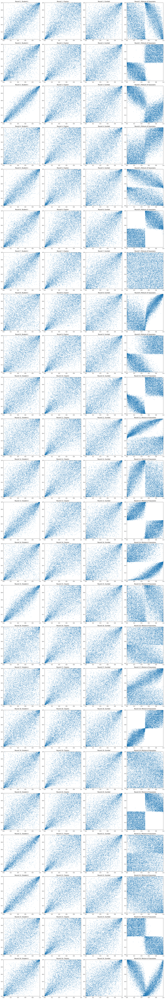

In [4]:
import matplotlib.pyplot as plt

# Assuming sims_runs_all is already populated with the samples

fig, axes = plt.subplots(24, 4, figsize=(20, 120))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

for i in range(24):
    for j in range(4):
        ax = axes[i * 4 + j]
        u1, u2 = sims_runs_all[i][j]
        ax.scatter(u1, u2, s=1)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(f'Round {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

### Single NNet ratio copula

In [511]:
ratios = []

for r,run in tqdm(enumerate(sims_runs_all[:1])):
    # run = [u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]
    for u,u1_u2 in enumerate(run):
        # u1_u2 = [u1, u2]
        z1,z2 = scs.norm.ppf(u1_u2[0][:N_TRAIN]),scs.norm.ppf(u1_u2[1][:N_TRAIN])
        p_data = np.column_stack((z1,z2))
        p_data = np.nan_to_num(p_data, nan=0, posinf=0, neginf=0)
        q_data = np.random.randn(50000,2)
        # Fit Ratio copula
        ratio = Ratio(h_dim=100, in_dim=2, h_layers=2, normalising_cst=True)
        #optimizer = torch.optim.Adam(ratio.parameters())
        optimizer = torch.optim.Adam(
            [{'params': [param for param in ratio.parameters() if param is not ratio.c]},
            {'params': [ratio.c], 'lr': 0.001}]  # Adjust the learning rate for ratio.c here
        )
        #if ratio.normalising_cst:
        #    optimizer.add_param_group({'params': ratio.c})

        for epoch in (range(501)):
            optimizer.zero_grad()
            r_p = ratio(torch.tensor(p_data).float())
            r_q = ratio(torch.tensor(np.random.randn(q_data.shape[0],2)).float())
            #loss = (-(r_p /(1+r_p)).log() - (1/(1+r_q)).log() ).mean()
            loss = loss_nce(r_p, r_q, p_data.shape[0], q_data.shape[0])
            loss.backward()
            optimizer.step()
            if epoch % 100 == 0 and epoch > 0:
                with torch.no_grad():
                    if True:#epoch==500:# check the value and gradient of the normalising constant
                        print(f'Epoch {epoch}, normalising constant {ratio.c.item()}', ratio.c.grad.item())
                    #check if loss is not a number
                    if torch.isnan(loss):
                        print(r,u,'NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                    #print(f'Epoch {epoch}, loss {loss.item()}')
        print('run',r,'cop_u',u,'DONE')
        ratios.append(ratio)


0it [00:00, ?it/s]

Epoch 100, normalising constant 1.0158300399780273 -0.0105399489402771
Epoch 200, normalising constant 1.013872504234314 0.00023651123046875
Epoch 300, normalising constant 1.0121577978134155 0.018787622451782227
Epoch 400, normalising constant 1.0105441808700562 0.004652678966522217
Epoch 500, normalising constant 1.009232759475708 0.011667490005493164
run 0 cop_u 0 DONE
Epoch 100, normalising constant 1.0096218585968018 -0.01126796007156372
Epoch 200, normalising constant 1.0084055662155151 0.010818839073181152
Epoch 300, normalising constant 1.006913185119629 0.013582885265350342
Epoch 400, normalising constant 1.0051640272140503 0.05332934856414795
Epoch 500, normalising constant 1.0034459829330444 -0.028181910514831543
run 0 cop_u 1 DONE
Epoch 100, normalising constant 1.0235432386398315 0.016575098037719727
Epoch 200, normalising constant 1.022147297859192 0.01535719633102417
Epoch 300, normalising constant 1.0190731287002563 -0.028342068195343018
Epoch 400, normalising constant 

1it [05:24, 324.28s/it]

Epoch 500, normalising constant 1.003131628036499 -0.08195024728775024
run 0 cop_u 3 DONE


IndexError: list index out of range

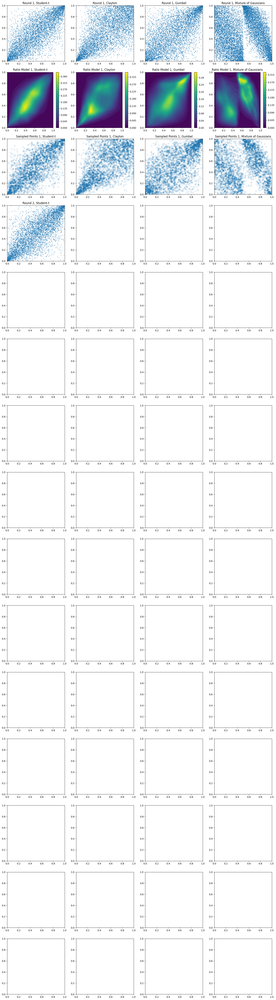

In [512]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import scipy.stats
from tqdm import tqdm
from scipy.special import logsumexp

def sample_ratio(ratio, n):
    '''
    Sample from the ratio copula with Sampling Importance Resampling.
    '''
    z = np.random.randn(n, 2)
    r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())
    sims = np.random.choice(np.arange(n), size=n, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
    return scipy.stats.norm.cdf(z[sims])

fig, axes = plt.subplots(int(75/5), 4, figsize=(20, int(375/5)))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

# Plot the true samples, the ratio models, and the sampled points
for i in range(5):
    for j in range(4):
        # Plot the true samples
        ax_true = axes[i * 12 + j]
        u1, u2 = sims_runs_all[i][j]
        ax_true.scatter(u1, u2, s=1)
        ax_true.set_xlim(0, 1)
        ax_true.set_ylim(0, 1)
        ax_true.set_title(f'Round {i+1}, {sample_types[j]}')

        # Plot the ratio models
        ax_ratio = axes[i * 12 + 4 + j]
        
        # Create a grid for plotting
        x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
        z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
        gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

        # Get the ratio
        r = ratios[i * 4 + j](z.float()).detach().numpy()
        Z = (r.reshape(100, 100)) * gauss
        contour = ax_ratio.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
        ax_ratio.set_xlim(0, 1)
        ax_ratio.set_ylim(0, 1)
        ax_ratio.set_title(f'Ratio Model {i+1}, {sample_types[j]}')
        fig.colorbar(contour, ax=ax_ratio)
        
        # Plot the sampled points
        ax_sampled = axes[i * 12 + 8 + j]
        samples_test = sample_ratio(ratios[i * 4 + j], 5000)
        ax_sampled.scatter(samples_test[:, 0], samples_test[:, 1], alpha=0.1)
        ax_sampled.set_xlim(0, 1)
        ax_sampled.set_ylim(0, 1)
        ax_sampled.set_title(f'Sampled Points {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

### Sampling with HMC

In [7]:
import scipy

# HMC sampling from the ratio copula
from pyhmc import hmc
def sample_ratio(ratio_model, n,hmc_runs=5,burn_in_n=1000,bimodal_hmc=False):
    def log_r_times_gauss(x):
        x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
        fun = torch.log(ratio_model(x_tensor))+torch.distributions.Normal(0,1).log_prob(x_tensor).sum()
        fun.backward()
        grad_wrt_x = x_tensor.grad
        return np.array(fun.item(),dtype=np.float64), np.array(grad_wrt_x.detach().numpy(),dtype=np.float64)

    def sample_ratio_IS(ratio, n_prop, n_out):
        '''
        Sample from the ratio copula with Sampling Importance Resampling.
        '''
        z = np.random.randn(n_prop, 2)
        r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())+torch.distributions.Normal(0,1).log_prob(torch.tensor(z).float()).sum(1).detach().numpy().reshape(-1,1)
        sims = np.random.choice(np.arange(n_prop), size=n_out, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
        return scipy.stats.norm.cdf(z[sims])

    samples = []
    log_pdf_samples = []
    for hmc_run in range(hmc_runs): # multiple runs to avoid local modes
        # pcik a starting point with IS to be closer to equilibrium, so shorter burn_in
        start_x = sample_ratio_IS(ratio_model, 100, 1)
        if bimodal_hmc: # run HMC from both sides of the mode via reflection of x_0
            samples1 = hmc(log_r_times_gauss,
                        x0=start_x[0],
                        n_samples=int(n/2),
                        return_logp= True,
                        n_burn = burn_in_n)
            samples2 = hmc(log_r_times_gauss,
                    x0=-start_x[0],
                    n_samples=int(n/2),
                    return_logp= True,
                    n_burn = burn_in_n)
            samples.append(np.concatenate([samples1[0],samples2[0]]))
            log_pdf_samples.append(np.concatenate([samples1[1],samples2[1]]))
        else: 
            samples1 = hmc(log_r_times_gauss,
                        x0=start_x[0],
                        n_samples=n,
                        return_logp= True,
                        n_burn = burn_in_n)
            samples.append(samples1[0])
            log_pdf_samples.append(samples1[1])

        print('run',hmc_run,'DONE')
    # combine all runs
    samples = np.concatenate(samples)
    log_pdf_samples = np.concatenate(log_pdf_samples)
    return samples, log_pdf_samples

n_runs = 100
n_sims = 100
samples, log_pdf_samples = sample_ratio(ratios[16], n_sims, hmc_runs=n_runs, burn_in_n=10,bimodal_hmc=True)

ModuleNotFoundError: No module named 'pyhmc'

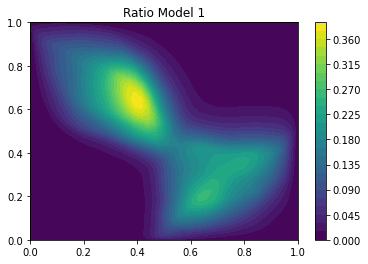

In [ ]:
# contourf of ratios[0]

x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

# Get the ratio
r = ratios[11](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title('Ratio Model 1')  
plt.colorbar()
plt.show()

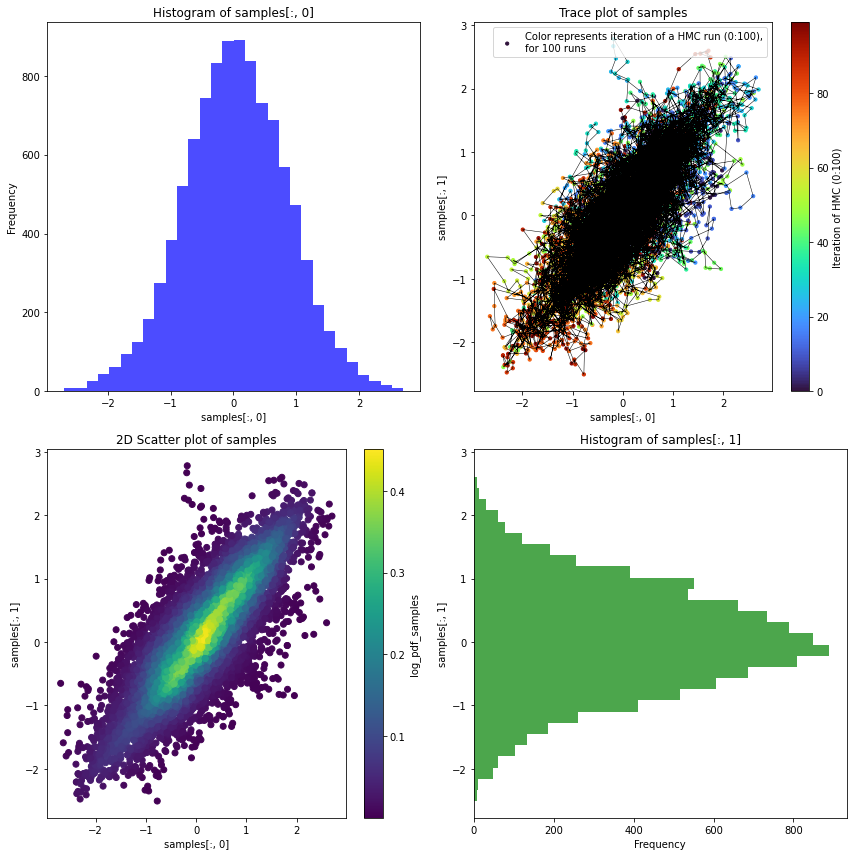

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming samples is a 2D array with shape (n_samples, 2)
# and log_pdf_samples is a 1D array with shape (n_samples,)

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Subplot [0,0]: Histogram of samples[:, 0]
axs[0, 0].hist(samples[:, 0], bins=30, color='blue', alpha=0.7)
axs[0, 0].set_title('Histogram of samples[:, 0]')
axs[0, 0].set_xlabel('samples[:, 0]')
axs[0, 0].set_ylabel('Frequency')

# Subplot [1,1]: Histogram of samples[:, 1] rotated 90 degrees clockwise
axs[1, 1].hist(samples[:, 1], bins=30, color='green', alpha=0.7, orientation='horizontal')
axs[1, 1].set_title('Histogram of samples[:, 1]')
axs[1, 1].set_xlabel('Frequency')
axs[1, 1].set_ylabel('samples[:, 1]')

# Subplot [1,0]: 2D scatter plot of samples with colors based on log_pdf_samples
sc = axs[1, 0].scatter(samples[:, 0], samples[:, 1], c=np.exp(log_pdf_samples), cmap='viridis', marker='o')
axs[1, 0].set_title('2D Scatter plot of samples')
axs[1, 0].set_xlabel('samples[:, 0]')
axs[1, 0].set_ylabel('samples[:, 1]')
fig.colorbar(sc, ax=axs[1, 0], label='log_pdf_samples')

# Subplot [0,1]: Trace plot of samples
color_array = np.tile(np.arange(n_sims), n_runs)
sc_ = axs[0, 1].scatter(samples[:, 0], samples[:, 1], c=color_array, cmap='turbo', s=10)  # Set size of points
axs[0, 1].scatter(samples[:, 0], samples[:, 1], c=color_array, cmap='turbo', alpha=0.1, s=10)  # Set size of points
axs[0, 1].plot(samples[:, 0], samples[:, 1], color='black', linewidth=0.5)
axs[0, 1].set_title('Trace plot of samples')
axs[0, 1].set_xlabel('samples[:, 0]')
axs[0, 1].set_ylabel('samples[:, 1]')
fig.colorbar(sc_, ax=axs[0, 1], label=f'Iteration of HMC (0:{n_sims})')
legend_label = f'Color represents iteration of a HMC run (0:{n_sims}),\nfor {n_runs} runs'
axs[0, 1].legend([legend_label], loc='upper right')


plt.tight_layout()
plt.show()

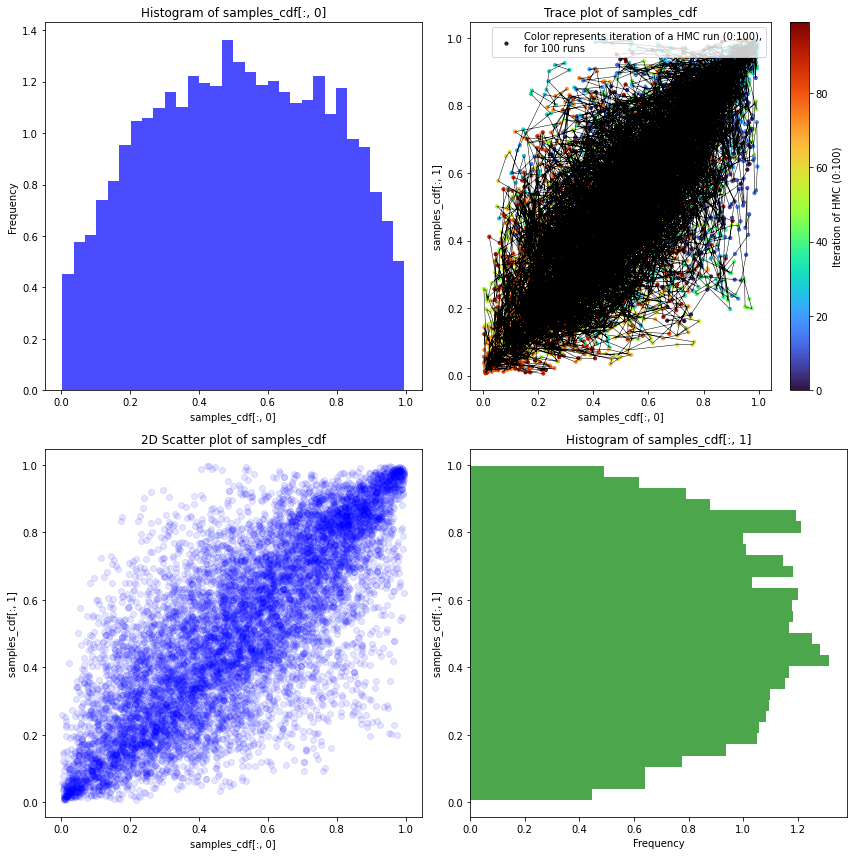

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as scs

# Assuming samples is a 2D array with shape (n_samples, 2)
# and log_pdf_samples is a 1D array with shape (n_samples,)

# Transform samples using the CDF
samples_cdf = scs.norm.cdf(samples)

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Subplot [0,0]: Histogram of samples_cdf[:, 0]
axs[0, 0].hist(samples_cdf[:, 0], bins=30, color='blue', alpha=0.7,density=True)
axs[0, 0].set_title('Histogram of samples_cdf[:, 0]')
axs[0, 0].set_xlabel('samples_cdf[:, 0]')
axs[0, 0].set_ylabel('Frequency')

# Subplot [1,1]: Histogram of samples_cdf[:, 1] rotated 90 degrees clockwise
axs[1, 1].hist(samples_cdf[:, 1], bins=30, color='green', alpha=0.7, orientation='horizontal',density=True)
axs[1, 1].set_title('Histogram of samples_cdf[:, 1]')
axs[1, 1].set_xlabel('Frequency')
axs[1, 1].set_ylabel('samples_cdf[:, 1]')

# Subplot [1,0]: 2D scatter plot of samples_cdf with colors based on log_pdf_samples
sc = axs[1, 0].scatter(samples_cdf[:, 0], samples_cdf[:, 1], c='blue',alpha=0.1, marker='o')
axs[1, 0].set_title('2D Scatter plot of samples_cdf')
axs[1, 0].set_xlabel('samples_cdf[:, 0]')
axs[1, 0].set_ylabel('samples_cdf[:, 1]')
#fig.colorbar(sc, ax=axs[1, 0], label='log_pdf_samples')

# Subplot [0,1]: Trace plot of samples_cdf
color_array = np.tile(np.arange(n_sims), n_runs)
sc_ = axs[0, 1].scatter(samples_cdf[:, 0], samples_cdf[:, 1], c=color_array, cmap='turbo', s=10)  # Set size of points
axs[0, 1].scatter(samples_cdf[:, 0], samples_cdf[:, 1], c=color_array, cmap='turbo', alpha=0.1, s=10)  # Set size of points
axs[0, 1].plot(samples_cdf[:, 0], samples_cdf[:, 1], color='black', linewidth=0.5)
axs[0, 1].set_title('Trace plot of samples_cdf')
axs[0, 1].set_xlabel('samples_cdf[:, 0]')
axs[0, 1].set_ylabel('samples_cdf[:, 1]')
fig.colorbar(sc_, ax=axs[0, 1], label=f'Iteration of HMC (0:{n_sims})')
legend_label = f'Color represents iteration of a HMC run (0:{n_sims}),\nfor {n_runs} runs'
axs[0, 1].legend([legend_label], loc='upper right')

plt.tight_layout()
plt.show()

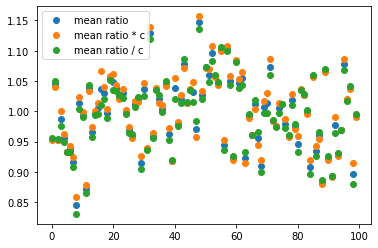

In [ ]:
prop_scale = 1
r_idx = 6
out = []
for r_idx in range(len(ratios)):
    samples_gauss = torch.normal(mean=0., std=prop_scale, size=(10000, 2))
    r_gauss_1_2 = torch.distributions.Normal(loc=0., scale=1.).log_prob(samples_gauss).sum(1).detach().numpy()-torch.distributions.Normal(loc=0., scale=prop_scale).log_prob(samples_gauss).sum(1).detach().numpy()
    r_gauss = ratios[r_idx](samples_gauss).detach().numpy()/np.exp(r_gauss_1_2) 
    out.append(   [ r_gauss.mean(),r_gauss.mean()*ratios[r_idx].c.item(),r_gauss.mean()/ratios[r_idx].c.item()])

plt.plot([out[i][0] for i in range(len(ratios))],'o',label='mean ratio')
plt.plot([out[i][1] for i in range(len(ratios))],'o',label='mean ratio * c')
plt.plot([out[i][2] for i in range(len(ratios))],'o',label='mean ratio / c')
plt.legend()

In [ ]:
import numpy as np
import scipy.stats as scs
from scipy.integrate import simps
import torch

# Define the grid
x = np.linspace(1e-5, 1-1e-5, 500)
y = np.linspace(1e-5, 1-1e-5, 500)
X, Y = np.meshgrid(x, y)

# Evaluate the function over the grid
Z = np.zeros_like(X)
for i in tqdm(range(len(x))):
    for j in range(len(y)):
        x_ = scs.norm.ppf(X[i, j])
        y_ = scs.norm.ppf(Y[i, j])
        Z[i, j] = ratios[-1](torch.tensor([x_, y_]).float()).detach().numpy()

# Integrate using Simpson's rule
integral = simps(simps(Z, y), x)

print(f"Integral result: {integral}")

100%|██████████| 500/500 [01:53<00:00,  4.39it/s]

Integral result: 0.993423868457321


### sampling with AIS

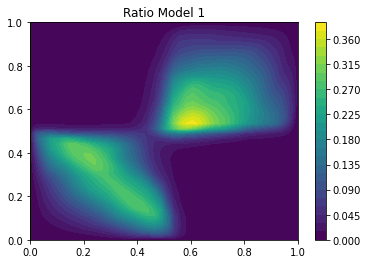

In [ ]:
model_NB = 7

x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

# Get the ratio
r = ratios[model_NB](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title('Ratio Model 1')  
plt.colorbar()
plt.show()

In [ ]:
import tensorflow as tf
import tensorflow_probability as tfp
import numpy as np
import torch
import torch.nn as nn
from pyhmc import hmc  
from tqdm import tqdm

# Define the ratio_model in PyTorch
class RatioModel(nn.Module):
    '''
    Pytorch ratio model.

    Args:
        ratio_model: The basic ratio model in pytorch.
    
    forward:
        Compute the log of ratio*gauss, which is the sampling density of the copula.
        inputs: The input to the ratio model.
            can be any array - is converted to torch.tensor inside.

    Returns:
        The log of the ratio model, as a numpy array.
    '''
    def __init__(self, ratio_model):
        super(RatioModel, self).__init__()
        self.ratio_model = ratio_model

    def forward(self, inputs):
        log_pdf, grad_x = self.log_r_times_gauss(inputs)
        return log_pdf

    def log_r_times_gauss(self, x):
        x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
        fun = torch.log(self.ratio_model(x_tensor)) + torch.distributions.Normal(0, 1).log_prob(x_tensor).sum()
        fun.backward()
        grad_wrt_x = x_tensor.grad
        return np.array(fun.item(), dtype=np.float64), np.array(grad_wrt_x.detach().numpy(), dtype=np.float64)

ratio_model_instance = RatioModel(ratios[model_NB])

# Define the target log-density function
def target_log_prob_fn(x):
    # Convert TensorFlow tensor to NumPy array
    x_np = x
    # Compute log-density using the PyTorch model
    log_density = ratio_model_instance(x_np)
    # Convert the result to a TensorFlow tensor
    return tf.convert_to_tensor(log_density, dtype=tf.float32)

# Set up the AIS sampler
num_results = 500
num_burnin_steps = 100
num_steps = 10
inverse_temperatures = tf.linspace(0.0, 1.0, num_steps)

# Initial distribution: standard normal
initial_distribution = tfp.distributions.MultivariateNormalDiag(loc=[0., 0.], scale_diag=[1.5, 1.5])

# Run the AIS sampler
def run_ais():
    samples = []
    current_state = initial_distribution.sample(num_results).numpy()
    for beta in tqdm(inverse_temperatures):
        def tempered_log_prob_fn(x):
            x_tensor = torch.tensor(x, requires_grad=True, dtype=torch.float32)
            log_prob, grad = ratio_model_instance.log_r_times_gauss(x_tensor)
            log_prob = beta * log_prob + (1 - beta) * tf.reduce_sum(initial_distribution.log_prob(x_tensor.detach().numpy())).numpy().item()
            return log_prob, grad

        current_state = torch.tensor(current_state, dtype=torch.float32)
        samples1, _ = hmc(tempered_log_prob_fn,  # Use the tempered log prob function here
                          x0=current_state[0],
                          n_samples=int(num_results/2),
                          return_logp=True,
                          n_burn=num_burnin_steps)
        current_state = samples1
        samples.append(current_state)

    return tf.convert_to_tensor(np.concatenate(samples, axis=0), dtype=tf.float32)

samples = run_ais()

# Convert samples to NumPy array
samples_np_tf = samples.numpy()

# Print the shape of the samples
print(f"Shape of the samples: {samples_np_tf.shape}")


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\david\AppData\Local\Temp\ipykernel_7772\3981766188.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
100%|██████████| 10/10 [02:09<00:00, 12.95s/it]

Shape of the samples: (2500, 2)


In [ ]:
import torch
import torch.nn as nn
import torch.distributions as dist
import numpy as np
from pyhmc import hmc
from tqdm import tqdm

# Define the ratio_model in PyTorch
class RatioModel(nn.Module):
    '''
    Pytorch ratio model.

    Args:
        ratio_model: The basic ratio model in pytorch.
    
    forward:
        Compute the log of ratio*gauss, which is the sampling density of the copula.
        inputs: The input to the ratio model.
            can be any array - is converted to torch.tensor inside.

    Returns:
        The log of the ratio model, as a numpy array.
    '''
    def __init__(self, ratio_model):
        super(RatioModel, self).__init__()
        self.ratio_model = ratio_model

    def forward(self, inputs):
        log_pdf, grad_x = self.log_r_times_gauss(inputs)
        return log_pdf

    def log_r_times_gauss(self, x):
        x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
        fun = torch.log(self.ratio_model(x_tensor)) + torch.distributions.Normal(0, 1).log_prob(x_tensor).sum()
        fun.backward()
        grad_wrt_x = x_tensor.grad
        return np.array(fun.item(), dtype=np.float64), np.array(grad_wrt_x.detach().numpy(), dtype=np.float64)

# Define the target log-density function
def target_log_prob_fn(x):
    x_tensor = torch.tensor(x, dtype=torch.float32)
    log_density = ratio_model_instance(x_tensor)
    return log_density

# Annealed Importance Sampling
def ais(num_samples, num_steps, initial_distribution, burn_steps):
    samples = initial_distribution.sample((num_samples,))
    inverse_temperatures = torch.linspace(0.0, 1.0, num_steps)

    for beta in tqdm(inverse_temperatures):
        def tempered_log_prob_fn(x):
            x_tensor = torch.tensor(x, requires_grad=True, dtype=torch.float32)
            log_prob, grad = ratio_model_instance.log_r_times_gauss(x_tensor)
            log_prob = beta * log_prob + (1 - beta) * initial_distribution.log_prob(x_tensor).sum().item()
            return log_prob, grad

        for i in range(num_samples):
            sample_np, _ = hmc(tempered_log_prob_fn,  # Use the tempered log prob function here
                               x0=samples[i].numpy(),
                               n_samples=1,
                               return_logp=True,
                               n_burn=burn_steps)
            samples[i] = torch.tensor(sample_np, dtype=torch.float32)

    return samples

# Example usage
ratio_model_instance = RatioModel(ratio_model=ratios[model_NB])  # Replace `your_ratio_model` with your actual model
initial_distribution = dist.MultivariateNormal(torch.zeros(2), torch.eye(2))
num_samples = 500
num_steps = 10
num_burn = 100

samples = ais(num_samples, num_steps, initial_distribution, num_burn)
samples_np_torch = samples.numpy()

print(f"Shape of the samples: {samples_np_torch.shape}")

  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\david\AppData\Local\Temp\ipykernel_7772\3387605066.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
100%|██████████| 10/10 [18:03<00:00, 108.33s/it]

Shape of the samples: (500, 2)


In [ ]:
samples_hmc, log_pdf_samples_hmc = sample_ratio(ratios[model_NB], n=500, hmc_runs=4, burn_in_n=10,bimodal_hmc=True)

run 0 DONE
run 1 DONE
run 2 DONE
run 3 DONE


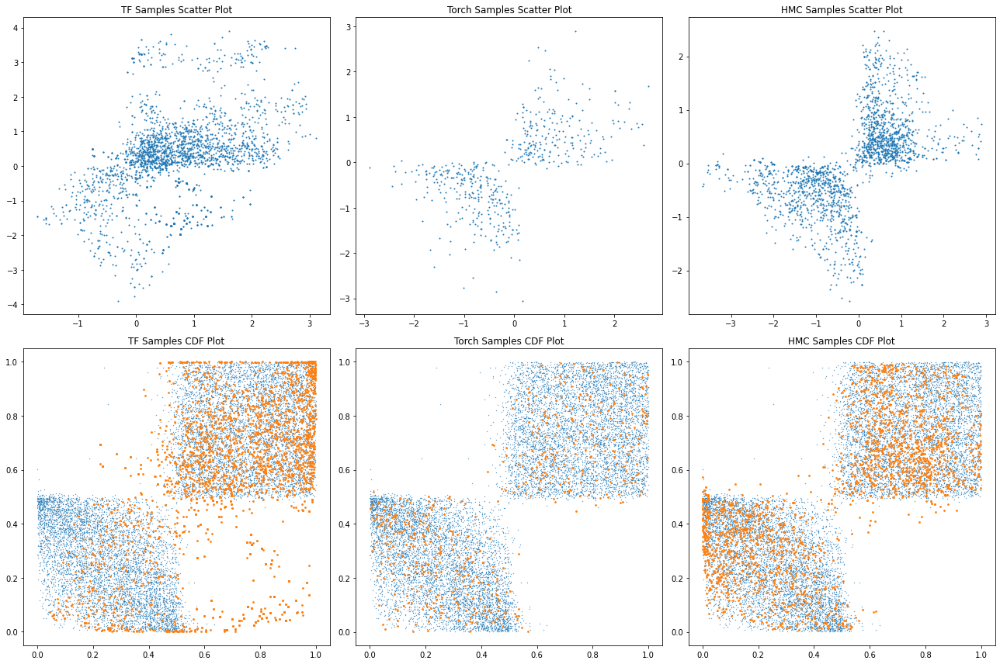

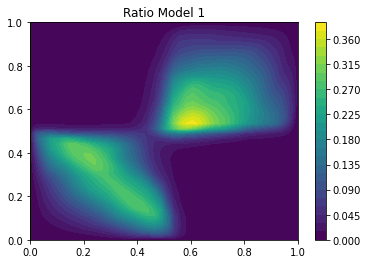

In [ ]:
# plot the difference between the three samples
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# First row: scatter plots
axs[0, 0].scatter(samples_np_tf[:, 0], samples_np_tf[:, 1], s=1)
axs[0, 0].set_title('TF Samples Scatter Plot')

axs[0, 1].scatter(samples_np_torch[:, 0], samples_np_torch[:, 1], s=1)
axs[0, 1].set_title('Torch Samples Scatter Plot')

axs[0, 2].scatter(samples_hmc[:, 0], samples_hmc[:, 1], s=1)
axs[0, 2].set_title('HMC Samples Scatter Plot')

# Second row: CDF plots
u1, u2 = sims_runs_all[model_NB//4][model_NB%4]
axs[1, 0].scatter(u1, u2, s=0.1)
axs[1, 0].scatter(scs.norm.cdf(samples_np_tf[:, 0]), scs.norm.cdf(samples_np_tf[:, 1]), s=3)
axs[1, 0].set_title('TF Samples CDF Plot')

axs[1, 1].scatter(u1, u2, s=0.1)
axs[1, 1].scatter(scs.norm.cdf(samples_np_torch[:, 0]), scs.norm.cdf(samples_np_torch[:, 1]), s=3)
axs[1, 1].set_title('Torch Samples CDF Plot')

axs[1, 2].scatter(u1, u2, s=0.1)
axs[1, 2].scatter(scs.norm.cdf(samples_hmc[:, 0]), scs.norm.cdf(samples_hmc[:, 1]), s=3)
axs[1, 2].set_title('HMC Samples CDF Plot')

plt.tight_layout()
plt.show()

# Plot the ratio model
x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scs.norm.pdf(x) * scs.norm.pdf(y)

# Get the ratio
r = ratios[7](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contourf(scs.norm.cdf(x), scs.norm.cdf(y), Z, levels=30)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title('Ratio Model 1')  
plt.colorbar()
plt.show()

### W+L+Ratio: Logistic classifier on waymarks

In [376]:
def waymark(data_p, data_q, alpha):

    if not isinstance(data_p, torch.Tensor):
        data_p = torch.tensor(data_p)
    if not isinstance(data_q, torch.Tensor):
        data_q = torch.tensor(data_q)
    if not isinstance(alpha, torch.Tensor):
        alpha = torch.tensor(alpha)

    if data_p.shape[0] < data_q.shape[0]:
        random_state = np.random.RandomState(42)
        data_p_expand_ = data_p[random_state.choice(data_p.shape[0], data_q.shape[0]-data_p.shape[0], replace=True)]
        data_p_expand = torch.concatenate([data_p_expand_, data_p])
    else:  
        data_p_expand = data_p
    return torch.sqrt(1 - alpha) * data_p_expand + torch.sqrt(alpha) * data_q

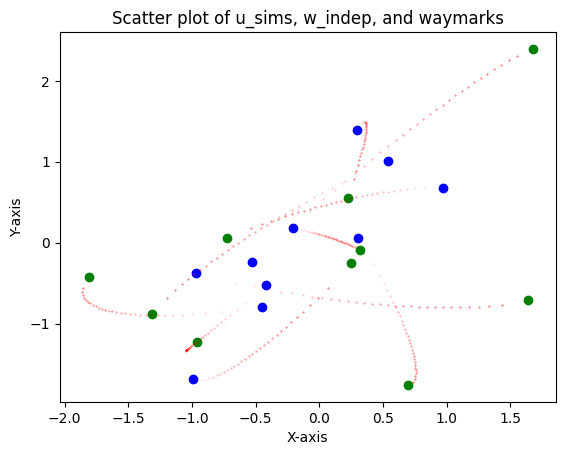

In [486]:
# Bridge paths

# Define the slicing and bridges parameters
slice_ = 10
bridges = 30

u_sims_ = np.array(sims_runs_all[0][0]).T
z_cop_samples = scs.norm.ppf(u_sims_[:slice_])
w_indep = np.random.randn(slice_, 2)


# Scatter plot for u_sims and w_indep
plt.scatter(z_cop_samples[:slice_, 0], z_cop_samples[:slice_, 1], label='u_sims', color='blue')
plt.scatter(w_indep[:slice_, 0], w_indep[:slice_, 1], label='w_indep', color='green')

# Loop through i and scatter waymark points with gradient red color
for i in range(bridges):
    alpha = i / bridges
    w_ = waymark(z_cop_samples[:slice_], w_indep[:slice_], torch.tensor(alpha))
    plt.scatter(w_[:, 0], w_[:, 1], color=(1, 0, 0,np.sqrt(alpha)), label=f'waymark {alpha:.1f}',s=0.1)

plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Scatter plot of u_sims, w_indep, and waymarks')
plt.show()

C:\Users\u1819911\AppData\Local\Temp\ipykernel_20676\3276050382.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  alpha = torch.tensor(alpha)


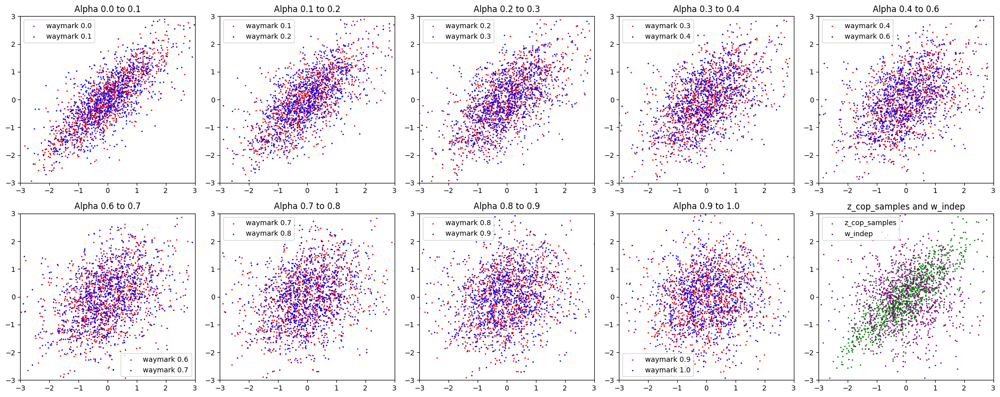

In [29]:
# Bridge datasets

# Define the slicing and bridges parameters
slice_ = 1000
bridges = 10

u_sims_ = np.array(sims_runs_all[0][0]).T
z_cop_samples = scs.norm.ppf(u_sims_[:slice_])
w_indep = np.random.randn(slice_, 2)

# Create subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# Generate alpha values
alphas = np.linspace(0, 1, bridges)

# Loop through the bridges and create subplots
for i in range(bridges - 1):
    alpha_i = alphas[i]
    alpha_i1 = alphas[i + 1]
    
    w_i = waymark(z_cop_samples[:slice_], w_indep[:slice_], torch.tensor(alpha_i))
    w_i1 = waymark(z_cop_samples[:slice_], w_indep[:slice_], torch.tensor(alpha_i1))
    
    ax = axes[i]
    ax.scatter(w_i[:, 0], w_i[:, 1], color='red', label=f'waymark {alpha_i:.1f}', s=1)
    ax.scatter(w_i1[:, 0], w_i1[:, 1], color='blue', label=f'waymark {alpha_i1:.1f}', s=1)
    
    ax.set_xlim(-3, 3)
    ax.set_ylim(-3, 3)
    ax.set_title(f'Alpha {alpha_i:.1f} to {alpha_i1:.1f}')
    ax.legend()

# Add the scatter plot of z_cop_samples and w_indep to the last subplot
ax_last = axes[-1]
ax_last.scatter(z_cop_samples[:, 0], z_cop_samples[:, 1], color='green', label='z_cop_samples', s=1)
ax_last.scatter(w_indep[:, 0], w_indep[:, 1], color='purple', label='w_indep', s=1)
ax_last.set_xlim(-3, 3)
ax_last.set_ylim(-3, 3)
ax_last.set_title('z_cop_samples and w_indep')
ax_last.legend()

plt.tight_layout()
plt.show()

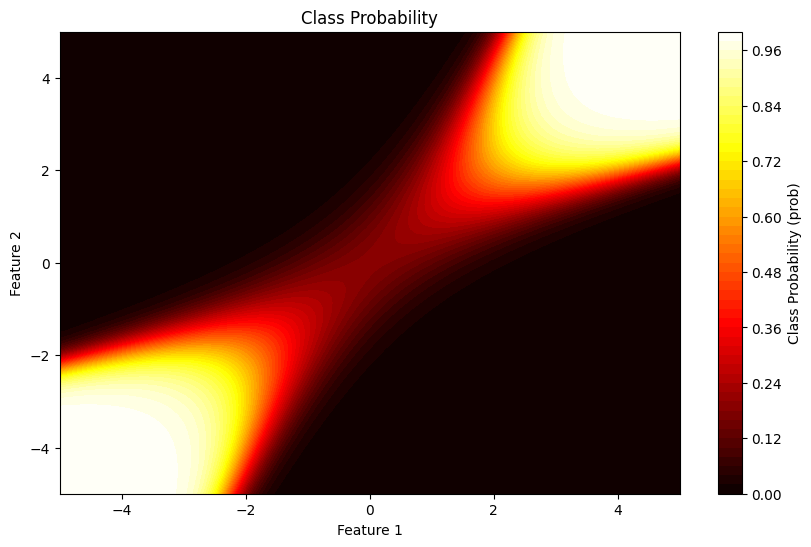

"# NN-ratio\nx, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))\nz = torch.tensor(np.column_stack((x.flatten(), y.flatten())))\ngauss = scs.norm.pdf(x) * scs.norm.pdf(y)\n# Get the ratio \nr = ratios[0](z.float()).detach().numpy()\nZ = (r.reshape(100, 100)) * gauss\nplt.contour(x, y, Z, levels=30,alpha=1)\nplt.title('Ratio Model 1')  "

In [195]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt

slice_ = 1000 # adjust the number of training samples

u_cop = np.array(sims_runs_all[0][2]).T
z_cop = scs.norm.ppf(u_cop[:slice_])
z_indep = scs.norm.rvs(size=(u_cop.shape))

def train_poly_classifier(z_cop, z_indep, degree=4):
    ''' 
    Trains a logistic regression classifier on a polynomial expansion of the given data.

    Args:
        z_cop: The copula data. (n, dim)
        z_indep: The independent data. (n, dim)
        degree: The degree of the polynomial expansion including interactions. (scalar)

    Returns:
        model: The trained logistic regression model.\n
        poly: The polynomial feature transformer to get polynomial features of new data as poly.transform(new_data).
    '''
    # label and combine the data
    X = np.vstack((z_cop, z_indep))
    y = np.hstack((np.ones(z_cop.shape[0]), np.zeros(z_indep.shape[0])))

    # Create polynomial features up to order 4 for x1, x2, and their interaction up to order 2
    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_poly = poly.fit_transform(X)

    # Fit the logistic regression model
    model = LogisticRegression(solver='newton-cg')
    model.fit(X_poly, y)
    
    return model, poly




import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as scs

def plot_log_ratio_logistic(model, poly, z_cop, z_indep, use_cdf=False, times_gauss=False, Ratio_prob=True, include_data=False, title=None):
    '''
    Plots the log-ratio log(prob / (1 - prob)) or class probabilities on a meshgrid.

    Args:
        model: The trained logistic classification model, giving prob(y=1).
        poly: The polynomial feature transformer.
        z_cop: The copula data.
        z_indep: The independent data.
        use_cdf: Boolean flag to use CDF of the input data for plotting.
        times_gauss: Boolean flag to multiply by Gaussian PDF.
        Ratio_prob: Boolean flag to plot the ratio of probabilities or class probabilities.
        include_data: Boolean flag to include the input data in the plot.
        title: Custom title for the plot.
    '''
    # Define the meshgrid range
    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    xx, yy = np.meshgrid(x, y)
    grid = np.c_[xx.ravel(), yy.ravel()]

    # Transform the meshgrid using the polynomial feature transformer
    grid_poly = poly.transform(grid)

    # Predict the probabilities
    proba = model.predict_proba(grid_poly)[:, 1]

    if Ratio_prob:
        # Compute the ratio of probabilities
        prob_ratio = proba / (1 - proba)
        # Reshape the ratio to match the meshgrid shape
        prob_ratio = prob_ratio.reshape(xx.shape)
        prob_ratio = np.log(prob_ratio)
        if times_gauss:
            prob_ratio = prob_ratio + scs.norm.logpdf(grid).sum(1).reshape(prob_ratio.shape)
        plot_data = prob_ratio
        colorbar_label = 'Log Probability Ratio (log(prob / (1 - prob)))'
    else:
        # Reshape the probabilities to match the meshgrid shape
        proba = proba.reshape(xx.shape)
        plot_data = proba
        colorbar_label = 'Class Probability (prob)'

    # Construct the title based on the parameters if no custom title is provided
    if title is None:
        if Ratio_prob:
            title = 'Class Probability of ratio copula'
        else:
            scale = 'copula scale' if use_cdf else 'Gaussian scale'
            title = f'Class Probability on {scale}'
            if times_gauss:
                title += ' with ratio*gauss'

    # Plot the data on the meshgrid
    plt.figure(figsize=(10, 6))
    if use_cdf:
        xx = scs.norm.cdf(xx)
        yy = scs.norm.cdf(yy)
    plt.contourf(xx, yy, plot_data, levels=50, cmap='hot')
    plt.colorbar(label=colorbar_label)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(title)

    # Optionally include the input data in the plot
    if include_data:
        if use_cdf:
            plt.scatter(scs.norm.cdf(z_indep[:, 0]), scs.norm.cdf(z_indep[:, 1]), label='z_indep', s=1, c='blue')
            plt.scatter(scs.norm.cdf(z_cop[:, 0]), scs.norm.cdf(z_cop[:, 1]), label='z_cop', s=1, c='green')
        else:
            plt.scatter(z_indep[:, 0], z_indep[:, 1], label='z_indep', s=1, c='blue')
            plt.scatter(z_cop[:, 0], z_cop[:, 1], label='z_cop', s=1, c='purple')
        plt.legend()

model, poly = train_poly_classifier(z_cop, z_indep, degree=2)
plot_log_ratio_logistic(model, poly, z_cop, z_indep, use_cdf=False, times_gauss=False, Ratio_prob=False, include_data=False,title='Class Probability')
plt.show()

'''# NN-ratio
x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scs.norm.pdf(x) * scs.norm.pdf(y)
# Get the ratio 
r = ratios[0](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contour(x, y, Z, levels=30,alpha=1)
plt.title('Ratio Model 1')  ''' 

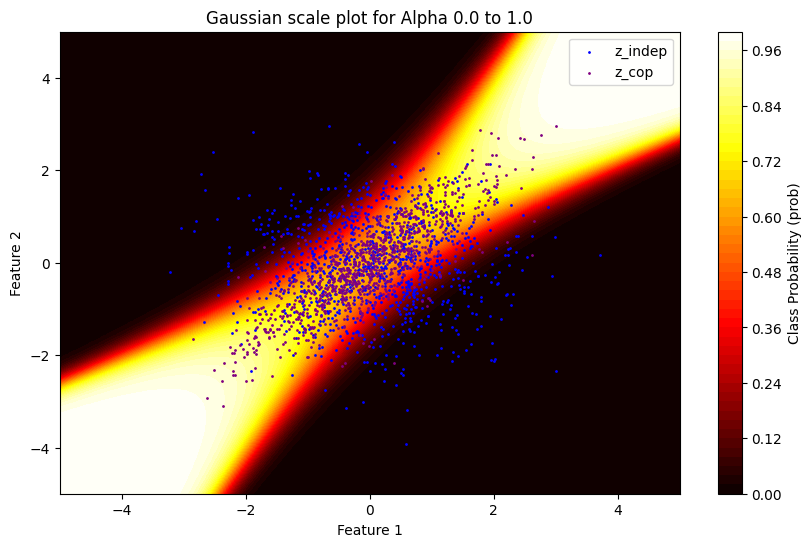

In [483]:
slice_ = 1000
bridges = 2

u_sims_ = np.array(sims_runs_all[0][0]).T
z_cop_samples = scs.norm.ppf(u_sims_[:slice_])
w_indep = np.random.randn(slice_, 2)

# Generate alpha values
alphas = np.linspace(0, 1, bridges)

ratios_logistic = []

# Loop through the bridges and create individual plots
for i in range(bridges - 1):
    alpha_i = alphas[i]
    alpha_i1 = alphas[i + 1]
    
    w_i = waymark(z_cop_samples[:slice_], w_indep[:slice_], torch.tensor(alpha_i))
    w_i1 = waymark(z_cop_samples[:slice_], w_indep[:slice_], torch.tensor(alpha_i1))

    # Train classifier and plot Gaussian data scale plot
    model, poly = train_poly_classifier(w_i, w_i1, degree=2)
    ratios_logistic.append([model, poly])
    plot_log_ratio_logistic(model, poly, w_i, w_i1, use_cdf=False, times_gauss=False, Ratio_prob=False, include_data=True, title=f'Gaussian scale plot for Alpha {alpha_i:.1f} to {alpha_i1:.1f}')
    plt.show()


In [482]:
def W_L_ratio_fit(z_cop,z_indep,waymarks=5,degrees=2):
    ''' 
    Waymarked logistic ratio copula fit. Fits a logistic classifier for each waymark to classify between the copula and independent data.

    Args:
        z_cop: The copula data. (n, dim)
        z_indep: The independent data. (n, dim)
        waymarks: The number of waymarks to fit classifiers for. (scalar)
        degrees: The degree of the polynomial expansion including interactions. (scalar)

    Returns:
        A list of tuples containing the logistic classifiers and polynomial feature transformers for each waymark. [[model,poly],...]
    '''

    alphas = np.linspace(0, 1, waymarks)
    ratios_logistic = []
    for i in tqdm(range(waymarks - 1)):
        alpha_i = alphas[i]
        alpha_i1 = alphas[i + 1]
        w_i = waymark(z_cop, z_indep, torch.tensor(alpha_i))
        w_i1 = waymark(z_cop, z_indep, torch.tensor(alpha_i1))
        model, poly = train_poly_classifier(w_i, w_i1, degree=degrees)
        ratios_logistic.append([model, poly])

    return ratios_logistic

def L_W_ratio_compute(logistic_ratios,x,log_pdf=True):
    ''' 
    Compute the ratio copula for a given input x using telescoping logistic classifiers.

    Args:
        logistic_ratios: A list of tuples containing the logistic classifiers and polynomial feature transformers.
        x: The input data.
        log_pdf: Boolean flag to return the log of the ratio copula.
    
    Returns:
        The ratio copula (log)pdf for the input x.
    '''
    out = 0
    for ratio in logistic_ratios:
        model, poly = ratio
        x_poly = poly.transform(x)
        proba = np.clip(model.predict_proba(x_poly)[:, 1], 1e-15, 1 - 1e-15)
        prob_ratio = np.log(proba) - np.log(1 - proba)
        out += prob_ratio
    if not log_pdf:
        out = np.exp(out)
    return out


L_W_ratio_compute(ratios_logistic, z_cop_samples[1].reshape(1,-1),log_pdf=False)

array([1.74858282])

100%|██████████| 9/9 [00:04<00:00,  2.13it/s]


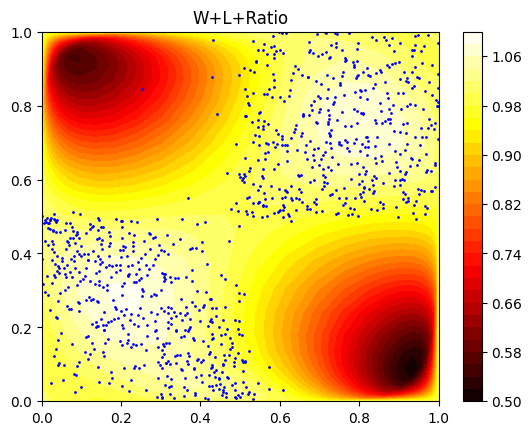

In [495]:
cdf_scale = True
lim_plot = 10

slice_ = 1000 # adjust the number of training samples
u_cop = np.array(sims_runs_all[1][3]).T[:slice_]
z_cop = scs.norm.ppf(u_cop)
z_indep = scs.norm.rvs(size=(20000,2))

W_L_ratios = W_L_ratio_fit(z_cop=z_cop,z_indep=z_indep,waymarks=10,degrees=6)

# L_W_ratio contourf
x, y = np.meshgrid(np.linspace(-lim_plot, lim_plot, 100), np.linspace(-lim_plot, lim_plot, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scs.norm.pdf(x) * scs.norm.pdf(y)
# Get the ratio
r = L_W_ratio_compute(W_L_ratios, z.float(),log_pdf=True)
Z = (r.reshape(100, 100)) * gauss
if cdf_scale:
    x = scs.norm.cdf(x)
    y = scs.norm.cdf(y)
    z1_ = u_cop[:, 0]
    z2_ = u_cop[:, 1]
else:
    z1_ = z_cop[:, 0]
    z2_ = z_cop[:, 1]
Z = np.exp(Z)
plt.contourf(x, y, Z, levels=30,cmap='hot')
plt.title('W+L+Ratio')
plt.colorbar()
plt.scatter(z1_,z2_, label='z_cop', color='blue', s=1)
plt.show()

In [505]:
# Fit W_L_ratio on all examples
W_L_ratios_all = []

for r,run in tqdm(enumerate(sims_runs_all)):
    # run = [u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]
    for u,u1_u2 in enumerate(run):
        # u1_u2 = [u1, u2]
        z1,z2 = scs.norm.ppf(u1_u2[0][:N_TRAIN]),scs.norm.ppf(u1_u2[1][:N_TRAIN])
        p_data = np.column_stack((z1,z2))
        p_data = np.nan_to_num(p_data, nan=0, posinf=0, neginf=0)
        q_data = np.random.randn(50000,2)
        # Fit Ratio copula
        ratio = W_L_ratio_fit(z_cop=p_data,z_indep=q_data,waymarks=10,degrees=6)

        print('run',r,'cop_u',u,'DONE')
        W_L_ratios_all.append(ratio)


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


run 0 cop_u 0 DONE


100%|██████████| 9/9 [00:13<00:00,  1.54s/it]


run 0 cop_u 1 DONE


100%|██████████| 9/9 [00:14<00:00,  1.65s/it]


run 0 cop_u 2 DONE


100%|██████████| 9/9 [00:15<00:00,  1.71s/it]
1it [00:57, 57.93s/it]

run 0 cop_u 3 DONE


100%|██████████| 9/9 [00:16<00:00,  1.80s/it]


run 1 cop_u 0 DONE


100%|██████████| 9/9 [00:13<00:00,  1.48s/it]


run 1 cop_u 1 DONE


100%|██████████| 9/9 [00:09<00:00,  1.06s/it]


run 1 cop_u 2 DONE


100%|██████████| 9/9 [00:10<00:00,  1.20s/it]
2it [01:47, 53.19s/it]

run 1 cop_u 3 DONE


100%|██████████| 9/9 [00:17<00:00,  1.90s/it]


run 2 cop_u 0 DONE


100%|██████████| 9/9 [00:12<00:00,  1.44s/it]


run 2 cop_u 1 DONE


100%|██████████| 9/9 [00:10<00:00,  1.11s/it]


run 2 cop_u 2 DONE


100%|██████████| 9/9 [00:13<00:00,  1.52s/it]
3it [02:41, 53.42s/it]

run 2 cop_u 3 DONE


100%|██████████| 9/9 [00:09<00:00,  1.06s/it]


run 3 cop_u 0 DONE


100%|██████████| 9/9 [00:13<00:00,  1.45s/it]


run 3 cop_u 1 DONE


100%|██████████| 9/9 [00:11<00:00,  1.33s/it]


run 3 cop_u 2 DONE


100%|██████████| 9/9 [00:12<00:00,  1.35s/it]
4it [03:28, 50.76s/it]

run 3 cop_u 3 DONE


100%|██████████| 9/9 [00:16<00:00,  1.78s/it]


run 4 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


run 4 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.38s/it]


run 4 cop_u 2 DONE


100%|██████████| 9/9 [00:10<00:00,  1.14s/it]
5it [04:18, 50.47s/it]

run 4 cop_u 3 DONE


100%|██████████| 9/9 [00:13<00:00,  1.46s/it]


run 5 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.33s/it]


run 5 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.35s/it]


run 5 cop_u 2 DONE


100%|██████████| 9/9 [00:11<00:00,  1.30s/it]
6it [05:07, 49.96s/it]

run 5 cop_u 3 DONE


100%|██████████| 9/9 [00:15<00:00,  1.71s/it]


run 6 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


run 6 cop_u 1 DONE


100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


run 6 cop_u 2 DONE


100%|██████████| 9/9 [00:07<00:00,  1.20it/s]
7it [05:51, 48.29s/it]

run 6 cop_u 3 DONE


100%|██████████| 9/9 [00:13<00:00,  1.49s/it]


run 7 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.33s/it]


run 7 cop_u 1 DONE


100%|██████████| 9/9 [00:13<00:00,  1.49s/it]


run 7 cop_u 2 DONE


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]
8it [06:45, 49.84s/it]

run 7 cop_u 3 DONE


100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


run 8 cop_u 0 DONE


100%|██████████| 9/9 [00:10<00:00,  1.11s/it]


run 8 cop_u 1 DONE


100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


run 8 cop_u 2 DONE


100%|██████████| 9/9 [00:11<00:00,  1.27s/it]
9it [07:28, 47.82s/it]

run 8 cop_u 3 DONE


100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


run 9 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


run 9 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.36s/it]


run 9 cop_u 2 DONE


100%|██████████| 9/9 [00:12<00:00,  1.44s/it]
10it [08:16, 47.91s/it]

run 9 cop_u 3 DONE


100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


run 10 cop_u 0 DONE


100%|██████████| 9/9 [00:13<00:00,  1.53s/it]


run 10 cop_u 1 DONE


100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


run 10 cop_u 2 DONE


100%|██████████| 9/9 [00:09<00:00,  1.03s/it]
11it [09:00, 46.83s/it]

run 10 cop_u 3 DONE


100%|██████████| 9/9 [00:11<00:00,  1.32s/it]


run 11 cop_u 0 DONE


100%|██████████| 9/9 [00:12<00:00,  1.34s/it]


run 11 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.38s/it]


run 11 cop_u 2 DONE


100%|██████████| 9/9 [00:09<00:00,  1.02s/it]
12it [09:46, 46.44s/it]

run 11 cop_u 3 DONE


100%|██████████| 9/9 [00:15<00:00,  1.75s/it]


run 12 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


run 12 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.37s/it]


run 12 cop_u 2 DONE


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]
13it [10:39, 48.56s/it]

run 12 cop_u 3 DONE


100%|██████████| 9/9 [00:13<00:00,  1.45s/it]


run 13 cop_u 0 DONE


100%|██████████| 9/9 [00:14<00:00,  1.56s/it]


run 13 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.41s/it]


run 13 cop_u 2 DONE


100%|██████████| 9/9 [00:10<00:00,  1.20s/it]
14it [11:30, 49.20s/it]

run 13 cop_u 3 DONE


100%|██████████| 9/9 [00:17<00:00,  1.97s/it]


run 14 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


run 14 cop_u 1 DONE


100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


run 14 cop_u 2 DONE


100%|██████████| 9/9 [00:08<00:00,  1.09it/s]
15it [12:18, 48.75s/it]

run 14 cop_u 3 DONE


100%|██████████| 9/9 [00:09<00:00,  1.02s/it]


run 15 cop_u 0 DONE


100%|██████████| 9/9 [00:10<00:00,  1.16s/it]


run 15 cop_u 1 DONE


100%|██████████| 9/9 [00:15<00:00,  1.71s/it]


run 15 cop_u 2 DONE


100%|██████████| 9/9 [00:06<00:00,  1.38it/s]
16it [12:59, 46.60s/it]

run 15 cop_u 3 DONE


100%|██████████| 9/9 [00:09<00:00,  1.01s/it]


run 16 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.30s/it]


run 16 cop_u 1 DONE


100%|██████████| 9/9 [00:09<00:00,  1.05s/it]


run 16 cop_u 2 DONE


100%|██████████| 9/9 [00:13<00:00,  1.45s/it]
17it [13:43, 45.58s/it]

run 16 cop_u 3 DONE


100%|██████████| 9/9 [00:14<00:00,  1.61s/it]


run 17 cop_u 0 DONE


100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


run 17 cop_u 1 DONE


100%|██████████| 9/9 [00:10<00:00,  1.16s/it]


run 17 cop_u 2 DONE


100%|██████████| 9/9 [00:16<00:00,  1.79s/it]
18it [14:35, 47.64s/it]

run 17 cop_u 3 DONE


100%|██████████| 9/9 [00:13<00:00,  1.46s/it]


run 18 cop_u 0 DONE


100%|██████████| 9/9 [00:14<00:00,  1.58s/it]


run 18 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.38s/it]


run 18 cop_u 2 DONE


100%|██████████| 9/9 [00:06<00:00,  1.35it/s]
19it [15:22, 47.30s/it]

run 18 cop_u 3 DONE


100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


run 19 cop_u 0 DONE


100%|██████████| 9/9 [00:12<00:00,  1.37s/it]


run 19 cop_u 1 DONE


100%|██████████| 9/9 [00:14<00:00,  1.64s/it]


run 19 cop_u 2 DONE


100%|██████████| 9/9 [00:11<00:00,  1.28s/it]
20it [16:11, 47.88s/it]

run 19 cop_u 3 DONE


100%|██████████| 9/9 [00:15<00:00,  1.75s/it]


run 20 cop_u 0 DONE


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


run 20 cop_u 1 DONE


100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


run 20 cop_u 2 DONE


100%|██████████| 9/9 [00:08<00:00,  1.07it/s]
21it [17:01, 48.52s/it]

run 20 cop_u 3 DONE


100%|██████████| 9/9 [00:19<00:00,  2.16s/it]


run 21 cop_u 0 DONE


100%|██████████| 9/9 [00:14<00:00,  1.59s/it]


run 21 cop_u 1 DONE


100%|██████████| 9/9 [00:15<00:00,  1.70s/it]


run 21 cop_u 2 DONE


100%|██████████| 9/9 [00:08<00:00,  1.04it/s]
22it [17:59, 51.26s/it]

run 21 cop_u 3 DONE


100%|██████████| 9/9 [00:13<00:00,  1.45s/it]


run 22 cop_u 0 DONE


100%|██████████| 9/9 [00:12<00:00,  1.44s/it]


run 22 cop_u 1 DONE


100%|██████████| 9/9 [00:12<00:00,  1.36s/it]


run 22 cop_u 2 DONE


100%|██████████| 9/9 [00:12<00:00,  1.44s/it]
23it [18:50, 51.24s/it]

run 22 cop_u 3 DONE


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


run 23 cop_u 0 DONE


100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


run 23 cop_u 1 DONE


100%|██████████| 9/9 [00:13<00:00,  1.55s/it]


run 23 cop_u 2 DONE


100%|██████████| 9/9 [00:11<00:00,  1.31s/it]
24it [19:40, 51.04s/it]

run 23 cop_u 3 DONE


100%|██████████| 9/9 [00:09<00:00,  1.09s/it]


run 24 cop_u 0 DONE


100%|██████████| 9/9 [00:12<00:00,  1.44s/it]


run 24 cop_u 1 DONE


100%|██████████| 9/9 [00:13<00:00,  1.46s/it]


run 24 cop_u 2 DONE


100%|██████████| 9/9 [00:07<00:00,  1.27it/s]
25it [20:23, 48.95s/it]

run 24 cop_u 3 DONE


In [507]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import scipy.stats
from tqdm import tqdm
from scipy.special import logsumexp

def sample_W_L_ratio(W_L_ratio, n):
    '''
    Sample from the ratio copula with Sampling Importance Resampling.
    '''
    z = np.random.randn(n, 2)
    r_log = L_W_ratio_compute(W_L_ratio, z,log_pdf=True)
    sims = np.random.choice(np.arange(n), size=n, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
    return scipy.stats.norm.cdf(z[sims])

fig, axes = plt.subplots(75, 4, figsize=(20, 375))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

# Plot the true samples, the ratio models, and the sampled points
for i in range(5):
    for j in range(4):
        # Plot the true samples
        ax_true = axes[i * 12 + j]
        u1, u2 = sims_runs_all[i][j]
        ax_true.scatter(u1, u2, s=1)
        ax_true.set_xlim(0, 1)
        ax_true.set_ylim(0, 1)
        ax_true.set_title(f'Round {i+1}, {sample_types[j]}')

        # Plot the ratio models
        ax_ratio = axes[i * 12 + 4 + j]
        
        # Create a grid for plotting
        x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
        z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
        gauss = scipy.stats.norm.logpdf(x) + scipy.stats.norm.logpdf(y)

        # Get the ratio
        r = L_W_ratio_compute(W_L_ratios_all[i * 4 + j], (z.float()).detach().numpy(),log_pdf=True) 
        Z_log = (r.reshape(100, 100)) + gauss
        Z = np.exp(Z_log)
        if (Z>5).sum() > 0:
            Z = np.clip(Z,0,0.5)
        contour = ax_ratio.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
        ax_ratio.set_xlim(0, 1)
        ax_ratio.set_ylim(0, 1)
        ax_ratio.set_title(f'W+L+Ratio Model {i+1}, {sample_types[j]}')
        fig.colorbar(contour, ax=ax_ratio)
        
        # Plot the sampled points
        ax_sampled = axes[i * 12 + 8 + j]
        samples_test = sample_W_L_ratio(W_L_ratios_all[i * 4 + j], 5000)
        ax_sampled.scatter(samples_test[:, 0], samples_test[:, 1], alpha=0.1)
        ax_sampled.set_xlim(0, 1)
        ax_sampled.set_ylim(0, 1)
        ax_sampled.set_title(f'Sampled Points {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

### W+Ratio copula

In [578]:
def W_Ratio_fit(z_cop,waymarks=5,ratio_args=None,return_waymark_datasets=False):
    ''' 
    Waymarked ratio copula fit. Fits a ratio model for each waymark to classify between the copula and independent data.

    Args:
        z_cop: The copula data. (n, dim)
        waymarks: The number of waymarks to fit classifiers for. (scalar)
        ratio_args: The arguments to pass to the ratio model. (list)
        return_waymark_datasets: Boolean flag to return the waymark datasets as a list for each waymark. (bool)
        
    Returns:
        A list of trained ratio models for each waymark.
    '''

    alphas = np.linspace(0, 1, waymarks)
    ratios = []
    waymark_datasets = []
    for i in tqdm(range(waymarks - 1)): # for each waymark
        alpha_i = alphas[i]
        alpha_i1 = alphas[i + 1]
        if ratio_args is not None:
            h_dim, in_dim, h_layers, normalising_cst = ratio_args 
        else:
            h_dim, in_dim, h_layers, normalising_cst = 100, 2, 2, True
        ratio = Ratio(h_dim=h_dim, in_dim=in_dim, h_layers=h_layers, normalising_cst = normalising_cst, c = 1.0)
        optimizer = torch.optim.Adam(ratio.parameters())
        
        for epoch in (range(501)): # train a single waymark model
            optimizer.zero_grad()
            z_indep = torch.randn((z_cop.shape))
            w_i = waymark(z_cop, z_indep, torch.tensor(alpha_i))
            w_i1 = waymark(z_cop, z_indep, torch.tensor(alpha_i1))
            r_p = ratio(w_i.float())
            r_q = ratio(w_i1.float())
            loss = loss_nce(r_p, r_q, p_data.shape[0], q_data.shape[0])
            loss.backward()
            optimizer.step()
            if epoch % 100 == 0 and epoch > 0:
                with torch.no_grad():
                    if True:#epoch==500:# check the value and gradient of the normalising constant
                        print(f'Epoch {epoch}, normalising constant {ratio.c.item()}', ratio.c.grad.item())
                    #check if loss is not a number
                    if torch.isnan(loss):
                        print(r,u,'NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
        ratios.append(ratio)
        waymark_datasets.append([w_i, w_i1])


    if return_waymark_datasets:
        return ratios, waymark_datasets
    else:
        return ratios


def L_W_ratio_compute(ratios_list,x,log_pdf=True):
    ''' 
    Compute the ratio copula for a given input x using telescoping NNet classifiers.

    Args:
        ratios_list: A list of trained ratio models.
        x: The input data.
        log_pdf: Boolean flag to return the log of the ratio copula.
    
    Returns:
        The ratio copula (log)pdf for the input x.
    '''
    if not isinstance(x, torch.Tensor):
        x = torch.tensor(x)

    out = 1
    for ratio in ratios_list:
        out *= ratio(x.float())
    return out


ratios_list, waymarks = W_Ratio_fit(z_cop=z_cop,waymarks=10,return_waymark_datasets=True)
L_W_ratio_compute(ratios_list, z_cop_samples[:2],log_pdf=False)

  0%|          | 0/9 [00:00<?, ?it/s]

Epoch 100, normalising constant 0.9979733824729919 -0.025541841983795166
Epoch 200, normalising constant 0.9960721731185913 -0.044861018657684326
Epoch 300, normalising constant 0.997138261795044 -0.0403326153755188
Epoch 400, normalising constant 0.9978440999984741 0.04667943716049194


 11%|█         | 1/9 [00:02<00:22,  2.76s/it]

Epoch 500, normalising constant 0.9981899261474609 -0.05045294761657715
Epoch 100, normalising constant 0.9985520243644714 -0.0037720799446105957
Epoch 200, normalising constant 0.9990054965019226 0.01977020502090454
Epoch 300, normalising constant 0.9990941882133484 -0.01612555980682373
Epoch 400, normalising constant 0.9987075328826904 -0.021413445472717285


 22%|██▏       | 2/9 [00:05<00:18,  2.69s/it]

Epoch 500, normalising constant 0.9989246726036072 -0.004580855369567871
Epoch 100, normalising constant 0.995991587638855 0.014818906784057617
Epoch 200, normalising constant 0.9958579540252686 -0.004567086696624756
Epoch 300, normalising constant 0.9951928853988647 0.0026439428329467773
Epoch 400, normalising constant 0.9950140118598938 0.01745206117630005


 33%|███▎      | 3/9 [00:08<00:16,  2.75s/it]

Epoch 500, normalising constant 0.994964063167572 0.02154707908630371
Epoch 100, normalising constant 0.9997748732566833 -0.002642214298248291
Epoch 200, normalising constant 0.9997628927230835 0.011700093746185303
Epoch 300, normalising constant 0.9996353983879089 0.009191334247589111
Epoch 400, normalising constant 0.9994397759437561 0.0005976557731628418


 44%|████▍     | 4/9 [00:10<00:13,  2.67s/it]

Epoch 500, normalising constant 0.9993338584899902 0.007566630840301514
Epoch 100, normalising constant 0.9967338442802429 -0.0018546581268310547
Epoch 200, normalising constant 0.9970775246620178 0.0018402338027954102
Epoch 300, normalising constant 0.9971641898155212 -0.00207597017288208
Epoch 400, normalising constant 0.9973778128623962 0.0005272626876831055


 56%|█████▌    | 5/9 [00:13<00:10,  2.60s/it]

Epoch 500, normalising constant 0.9973240494728088 -0.0006612539291381836
Epoch 100, normalising constant 0.9972712397575378 0.0014281272888183594
Epoch 200, normalising constant 0.9976567625999451 0.002368748188018799
Epoch 300, normalising constant 0.9980223774909973 -0.004002749919891357
Epoch 400, normalising constant 0.9980918765068054 -0.0045729875564575195


 67%|██████▋   | 6/9 [00:15<00:07,  2.59s/it]

Epoch 500, normalising constant 0.9980791807174683 0.003543853759765625
Epoch 100, normalising constant 0.9998705387115479 0.0064307451248168945
Epoch 200, normalising constant 1.0003037452697754 -0.002869844436645508
Epoch 300, normalising constant 0.9998170733451843 -0.006952941417694092
Epoch 400, normalising constant 1.0000287294387817 -0.006237387657165527


 78%|███████▊  | 7/9 [00:18<00:05,  2.55s/it]

Epoch 500, normalising constant 0.9999493360519409 0.0021935701370239258
Epoch 100, normalising constant 0.9996987581253052 -0.0006138086318969727
Epoch 200, normalising constant 0.9997285008430481 -0.0027734041213989258
Epoch 300, normalising constant 1.0000460147857666 -0.011949539184570312
Epoch 400, normalising constant 1.0009534358978271 0.011336565017700195


 89%|████████▉ | 8/9 [00:20<00:02,  2.54s/it]

Epoch 500, normalising constant 1.0005416870117188 0.007822990417480469
Epoch 100, normalising constant 1.0014926195144653 0.010697424411773682
Epoch 200, normalising constant 1.0005731582641602 0.014695525169372559
Epoch 300, normalising constant 0.999909520149231 -0.018224060535430908
Epoch 400, normalising constant 0.9992881417274475 -0.010858416557312012


100%|██████████| 9/9 [00:23<00:00,  2.58s/it]

Epoch 500, normalising constant 0.9984374642372131 -0.007217228412628174


tensor([[1.8328],
        [1.7456]], grad_fn=<MulBackward0>)

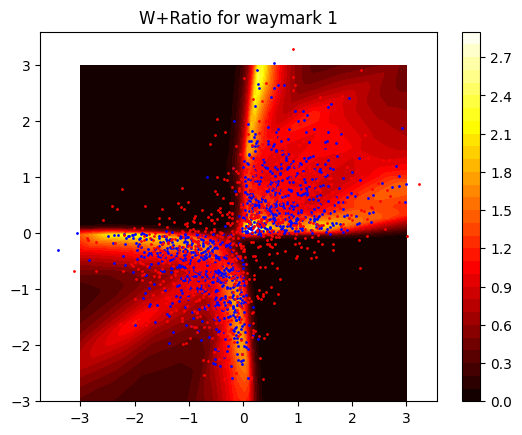

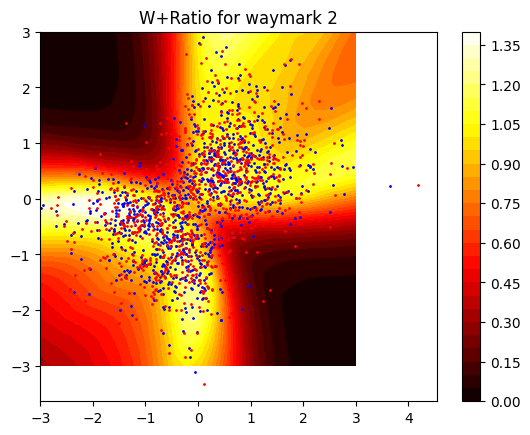

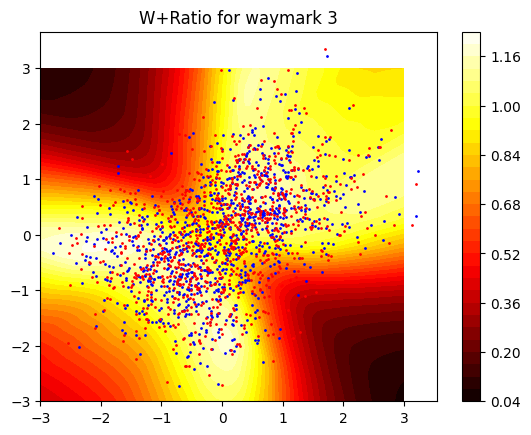

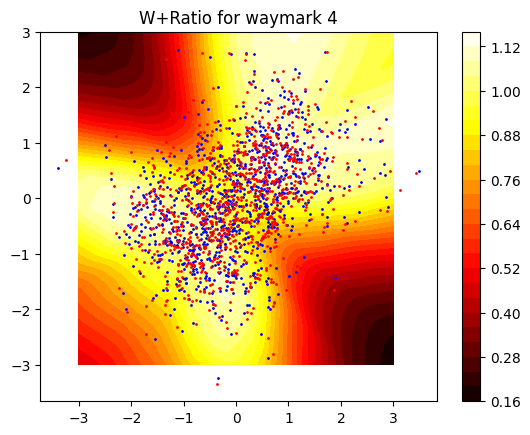

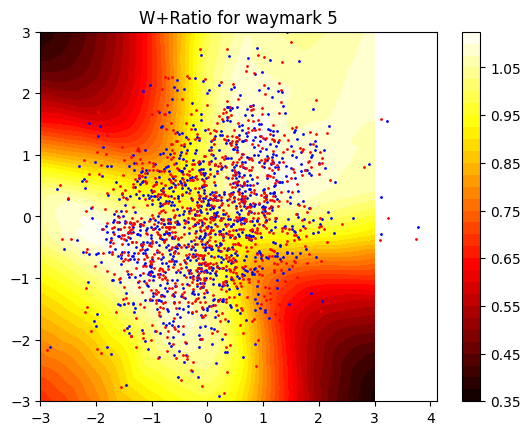

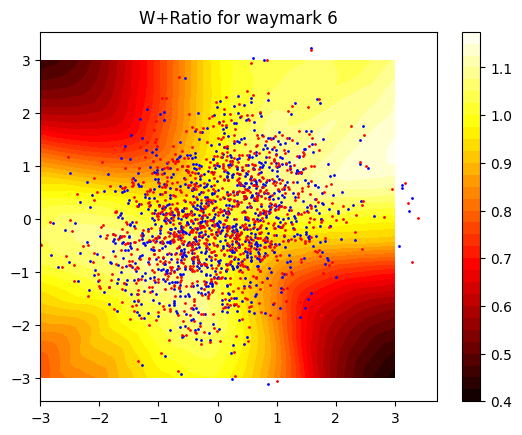

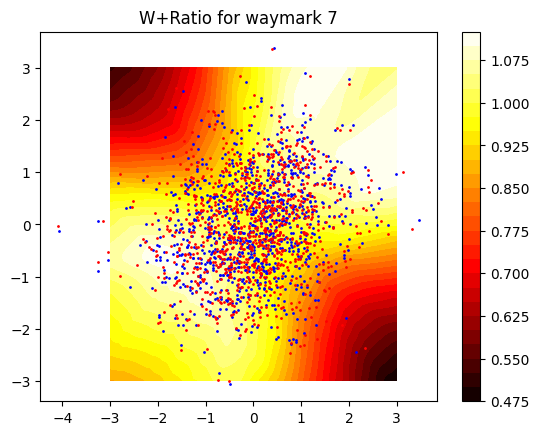

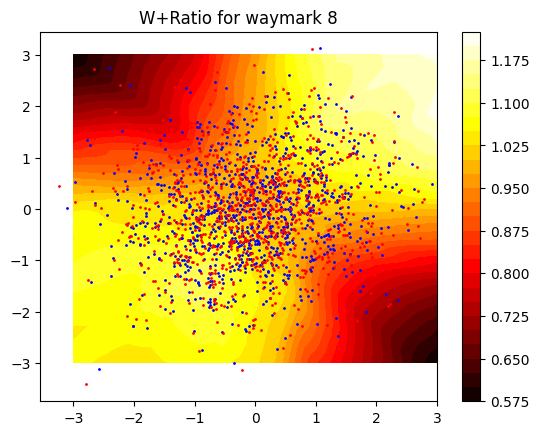

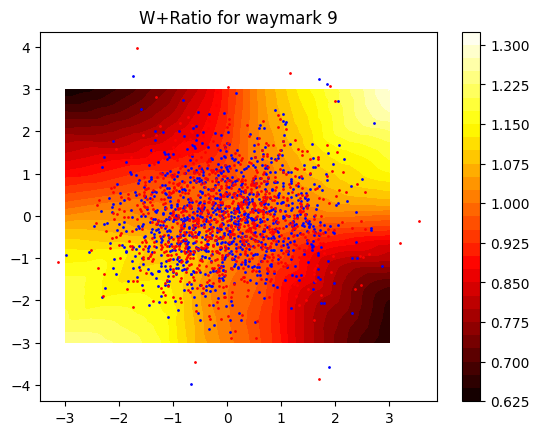

In [579]:
for i,w in enumerate(waymarks):
    # contourf of the ratio model
    x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
    z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
    gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)
    # Get the ratio
    r = (ratios_list[i](z.float())).detach().numpy()
    Z = (r.reshape(100, 100)) 
    plt.contourf(x, y, Z, levels=30, cmap='hot')
    plt.colorbar()
    plt.title('W+Ratio for waymark '+str(i+1))
    plt.scatter(w[0][:, 0], w[0][:, 1], label='w_i', s=1, c='blue')
    plt.scatter(w[1][:, 0], w[1][:, 1], label='w_i1', s=1, c='red')
    plt.show()

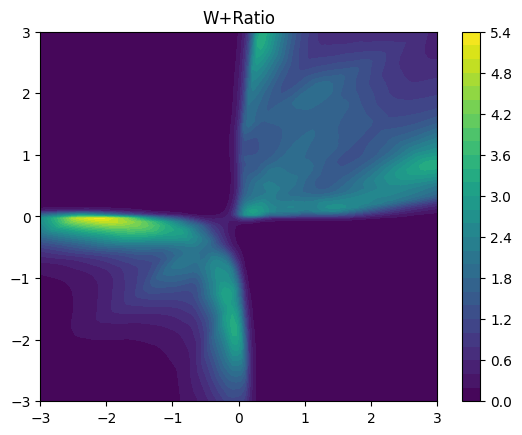

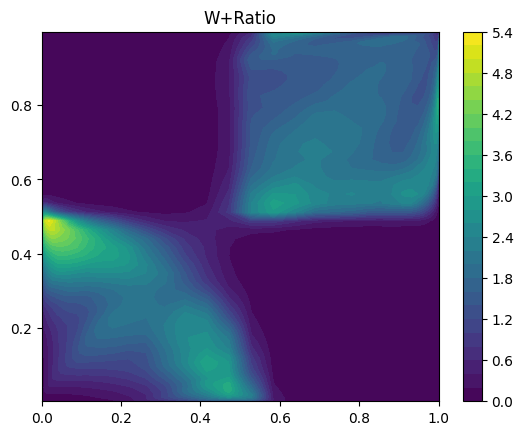

In [580]:
# plot final W_ratio
x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scs.norm.pdf(x) * scs.norm.pdf(y)
# Get the ratio
r = L_W_ratio_compute(ratios_list, z.float(),log_pdf=True).detach().numpy()
Z = (r.reshape(100, 100)) #* gauss
plt.contourf(x, y, Z, levels=30)
plt.colorbar()
plt.title('W+Ratio')
plt.show()

# plot final W_ratio
x, y = np.meshgrid(np.linspace(-7, 7, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scs.norm.pdf(x) * scs.norm.pdf(y)
# Get the ratio
r = L_W_ratio_compute(ratios_list, z.float(),log_pdf=True).detach().numpy()
Z = (r.reshape(100, 100)) #* gauss
plt.contourf(scs.norm.cdf(x), scs.norm.cdf(y), Z, levels=30)
plt.colorbar()
plt.title('W+Ratio')
plt.show()